<a href="https://colab.research.google.com/github/Atherizz/PCVK_Genap_2026/blob/main/week2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
from google.colab import files
uploaded = files.upload()

Saving ktm_new.jpg to ktm_new (1).jpg


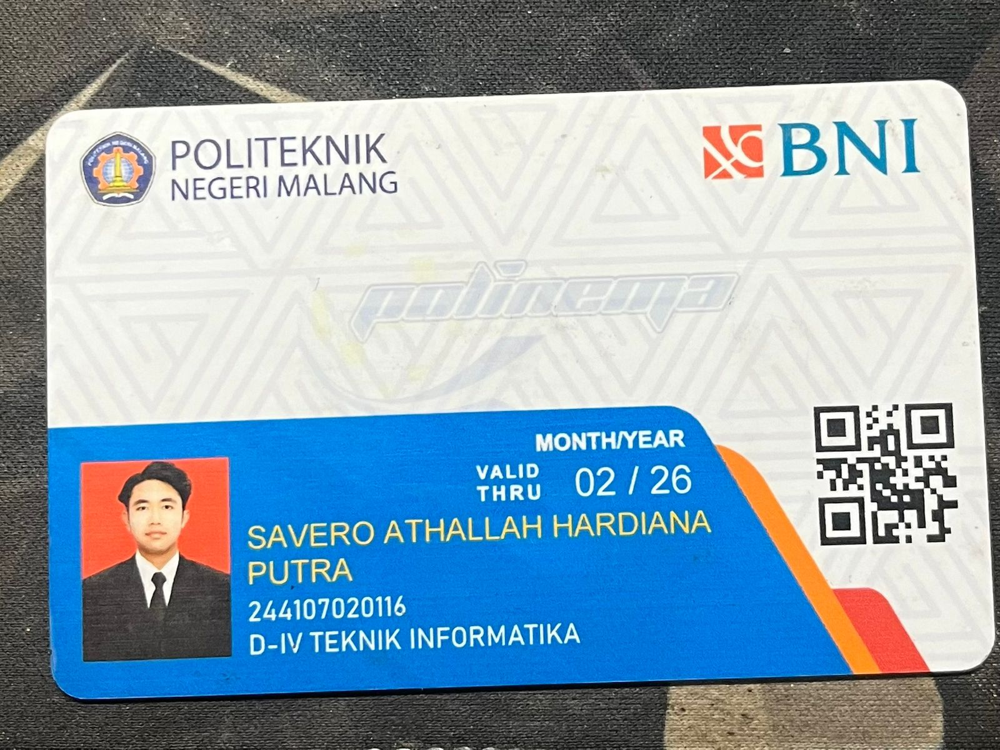

Resolusi gambar:  1600  x  1200


In [9]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np

img = cv.imread('ktm_new.jpg')
cv2_imshow(img)

print("Resolusi gambar: ", img.shape[1], " x ", img.shape[0])

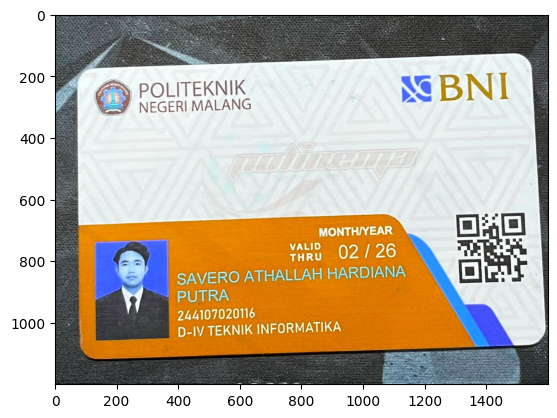

In [10]:
img = cv.imread('ktm_new.jpg')
plt.imshow(img)

In [11]:
img = cv.imread('ktm_new.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
plt.show()

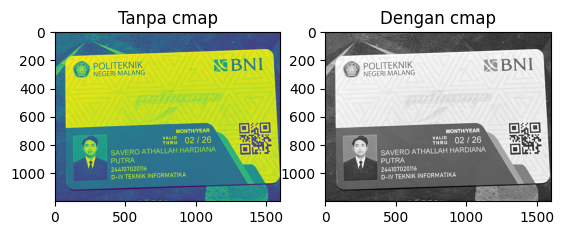

In [13]:
img_gray = cv.imread('ktm_new.jpg', cv.IMREAD_GRAYSCALE)

# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')

# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')

plt.show()

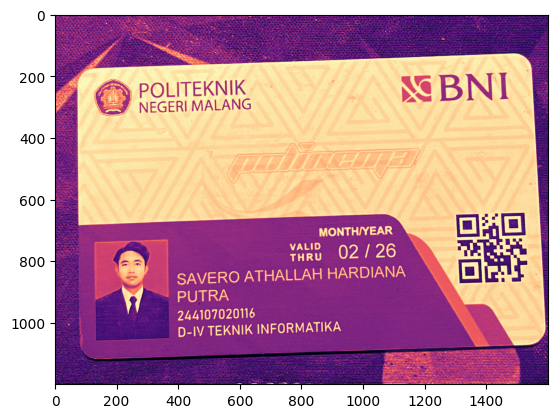

In [14]:
plt.imshow(img_gray, cmap='magma')

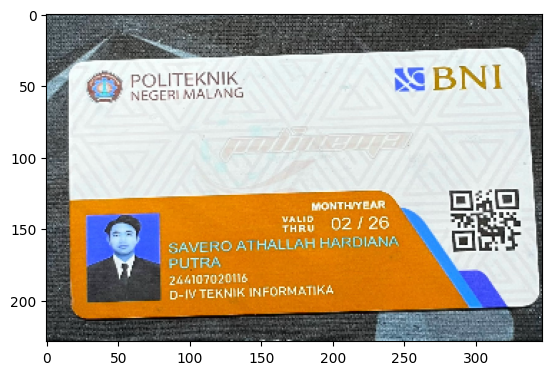

In [15]:
imgRGB = cv.cvtColor(img, cv.COLOR_BGR2RGB) #konversi BGR ke RGB
img_output = cv.resize(imgRGB, (347,229))
plt.imshow(img_output)

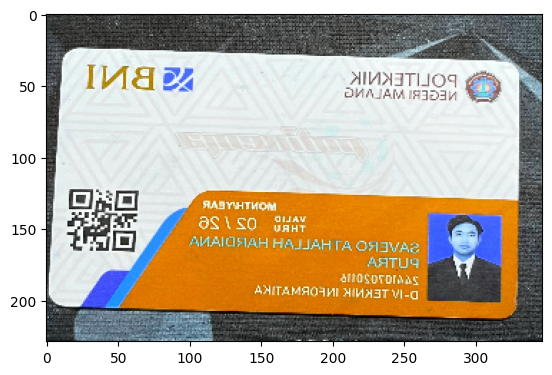

In [16]:
imgFlip=cv.flip(img_output,1)
plt.imshow(imgFlip)

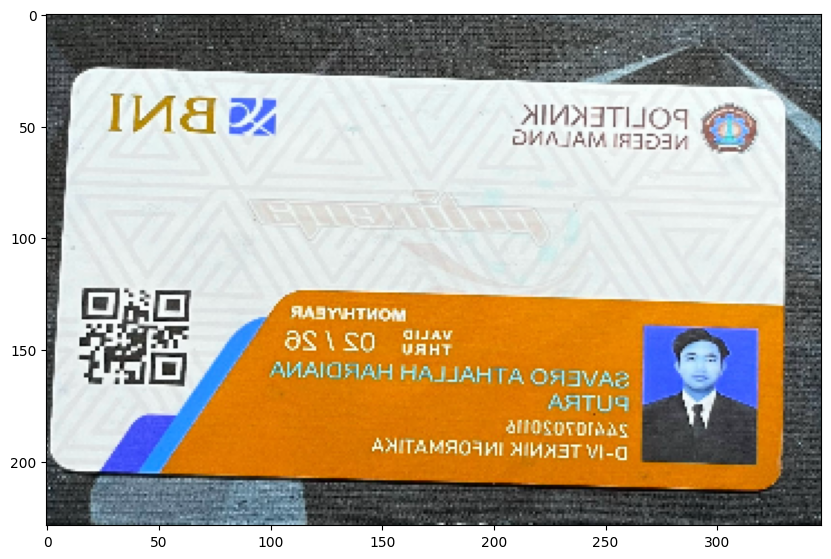

In [17]:
imgFlip=cv.flip(img_output,1)

#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(1,1,1)
ax.imshow(imgFlip)

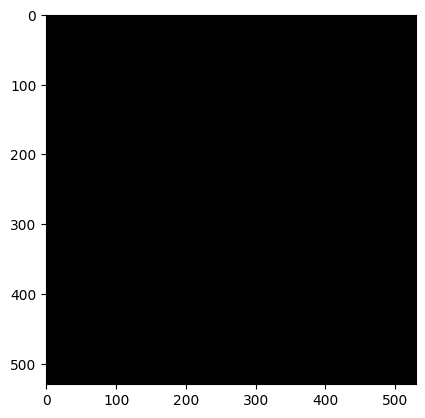

In [18]:
black_img = np.zeros(shape=(530,530,3),dtype=np.int16)
plt.imshow(black_img)

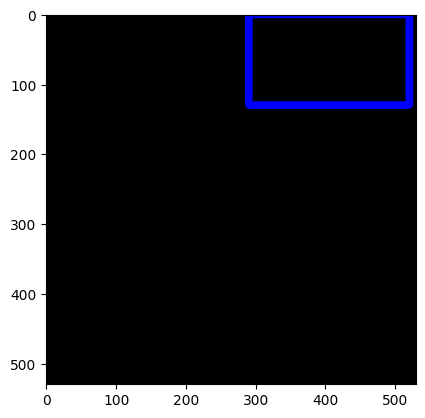

In [19]:
#perhatikan koordinat titik2 pt1 dan pt2
cv.rectangle(black_img,pt1=(290,0),pt2=(520,130),color=(0,0,255),thickness=10)
plt.imshow(black_img)

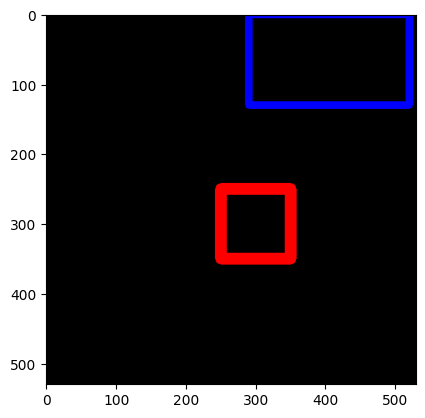

In [20]:
cv.rectangle(black_img,pt1=(250,250),pt2=(350,350),color=(255,0,0),thickness=15)
plt.imshow(black_img)

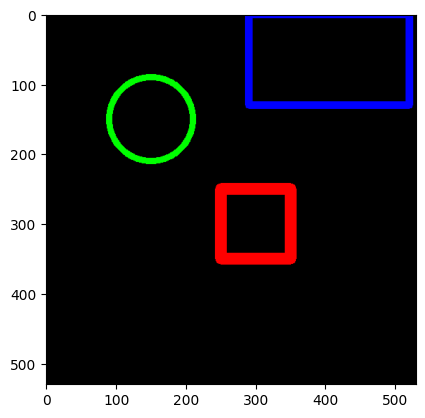

In [21]:
cv.circle(black_img,center=(150,150),radius=60,color=(0,255,0),thickness=8)
plt.imshow(black_img)

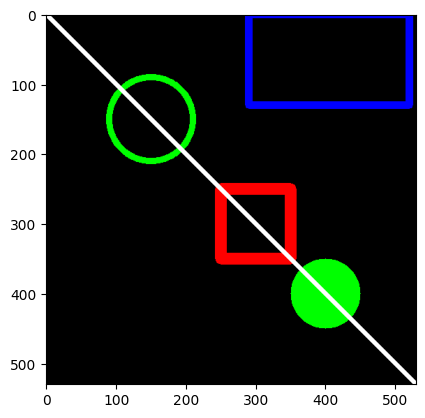

In [22]:
cv.circle(black_img,center=(400,400),radius=50,color=(0,255,0),thickness=-1)
cv.line(black_img,pt1=(0,0),pt2=(530,530),color=(255,255,255),thickness=5)
plt.imshow(black_img)

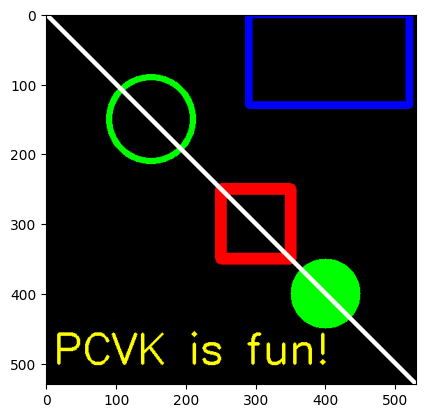

In [23]:
font = cv.FONT_HERSHEY_SIMPLEX
cv.putText(black_img,text='PCVK is fun!',org=(10,500),fontFace=font,fontScale=2,
           color=(255,255,0),thickness=3,lineType=cv.LINE_AA)
plt.imshow(black_img)

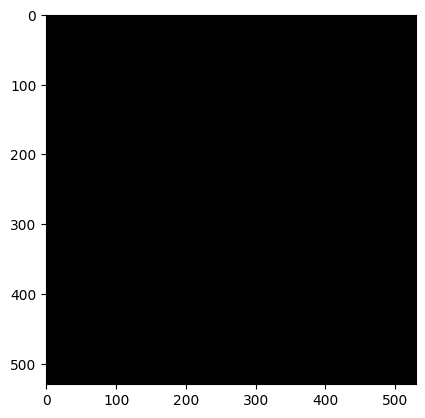

In [25]:
black_img2=np.zeros(shape=(530,530,3),dtype=np.int32)
plt.imshow(black_img2)

In [28]:
vertices = np.array([[150,350],[250,250],[450,350],[250,450]],dtype=np.int32)
vertices

pts = vertices.reshape((-1,1,2)) # nilai 2 untuk menunjukkan bahwa tiap titik dibuat 3 channel yg mewakili R, G, dan B
pts

array([[[150, 350]],

       [[250, 250]],

       [[450, 350]],

       [[250, 450]]], dtype=int32)

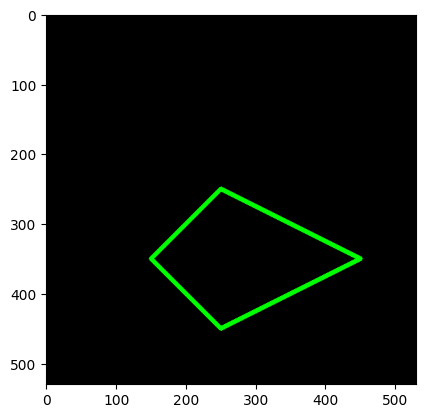

In [29]:
cv.polylines(black_img2,[pts],isClosed=True,color=(0,255,0),thickness=5)
plt.imshow(black_img2)

Tampilan cv2_imshow (BGR):


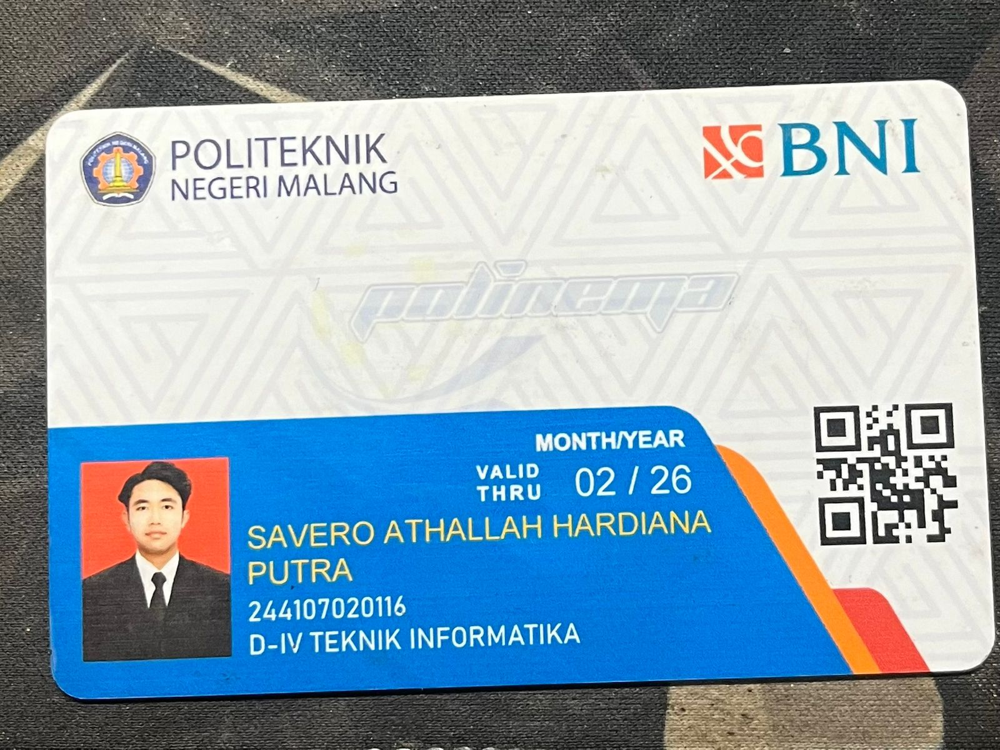

Tampilan plt.imshow (RGB):


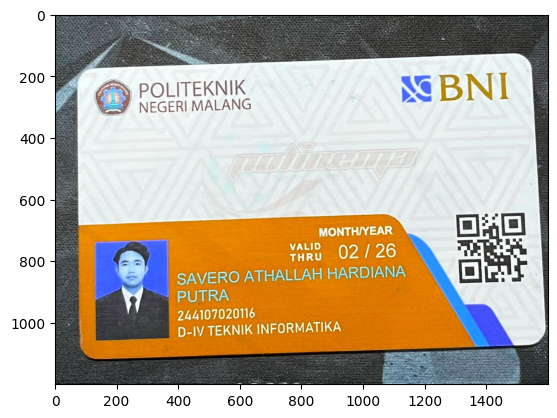

Nilai piksel (50, 50) [B, G, R]: [100 111 115]


In [30]:
## PERTANYAAN PRAKTIKUM
# NO 1.
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt

img = cv.imread('ktm_new.jpg')

print("Tampilan cv2_imshow (BGR):")
cv2_imshow(img)

print("Tampilan plt.imshow (RGB):")
plt.imshow(img)
plt.show()

# Bukti piksel
print("Nilai piksel (50, 50) [B, G, R]:", img[50, 50])



* **Penyebab:** OpenCV (`cv.imread`) membaca format **BGR**, sedangkan Matplotlib (`plt.imshow`) membaca format **RGB**. Tanpa konversi, kanal biru dan merah tertukar sehingga di Matplotlib tampak kebiruan.
* **Bukti nilai piksel:** Matplotlib membaca urutan piksel `[B, G, R]` milik OpenCV sebagai `[R, G, B]`, sehingga nilai kanal merah terisi nilai kanal biru citra asli.

In [ ]:
## NO 2
import numpy as np
import matplotlib.pyplot as plt

canvas_16 = np.zeros(shape=(530, 530, 3), dtype=np.int16)
canvas_32 = np.zeros(shape=(530, 530, 3), dtype=np.int32)

print(f"int16 -> dtype: {canvas_16.dtype}, min: {canvas_16.min()}, max: {canvas_16.max()}, nbytes: {canvas_16.nbytes} bytes")
print(f"int32 -> dtype: {canvas_32.dtype}, min: {canvas_32.min()}, max: {canvas_32.max()}, nbytes: {canvas_32.nbytes} bytes")

plt.subplot(1, 2, 1); plt.imshow(canvas_16); plt.title("int16")
plt.subplot(1, 2, 2); plt.imshow(canvas_32); plt.title("int32")
plt.show()

* **Tampilan berbeda?** Tidak, keduanya tetap hitam pekat karena semua piksel bernilai 0.
* **Ukuran memori berbeda?** Ya, `int32` memakai 3.370.800 bytes, sedangkan `int16` memakai 1.685.400 bytes (tepat setengahnya).
* **Alasan:** `int32` membutuhkan 4 byte (32 bit) per elemen, sedangkan `int16` hanya membutuhkan 2 byte (16 bit) per elemen.

## NO 3
* **Kegunaan `cv2_imshow`:** Menampilkan gambar langsung secara *inline* di dalam sel output notebook Google Colab.
* **Alasan `cv2.imshow()` tidak bisa:** `cv2.imshow()` memerlukan antarmuka GUI window desktop lokal (X11). Google Colab adalah server Linux cloud tanpa monitor (*headless*), sehingga memanggil fungsi tersebut akan memicu error atau membuat kernel *crash*.

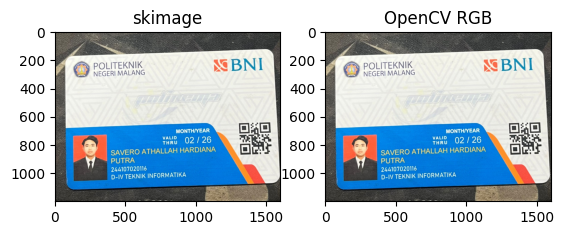

Piksel (50, 50) skimage     : [115 111 100]
Piksel (50, 50) OpenCV RGB : [115 111 100]
Apakah seluruh matriks identik?: True


In [31]:
## NO 4
from skimage import io
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

img_skimage = io.imread('ktm_new.jpg')
img_cv = cv.imread('ktm_new.jpg')
img_cv_rgb = cv.cvtColor(img_cv, cv.COLOR_BGR2RGB)

plt.subplot(1, 2, 1); plt.imshow(img_skimage); plt.title("skimage")
plt.subplot(1, 2, 2); plt.imshow(img_cv_rgb); plt.title("OpenCV RGB")
plt.show()

print("Piksel (50, 50) skimage     :", img_skimage[50, 50])
print("Piksel (50, 50) OpenCV RGB :", img_cv_rgb[50, 50])
print("Apakah seluruh matriks identik?:", np.array_equal(img_skimage, img_cv_rgb))

* **Hasil:** Keduanya menampilkan **warna sebenarnya (RGB)** dan **tidak ada kanal yang tertukar**.
* **Bukti nilai piksel:** `skimage.io.imread()` membaca citra langsung dalam format RGB, sementara `cv.cvtColor(..., cv.COLOR_BGR2RGB)` mengonversi BGR ke RGB. Hasil pengecekan piksel menunjukkan nilai yang sama persis (`np.array_equal` bernilai `True`).


In [ ]:
## NO 5
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('ktm_new.jpg')
print("img.shape awal:", img.shape)

plt.figure(figsize=(15, 15))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.show()

print("img.shape setelah figsize:", img.shape)

* **Apakah `img.shape` berubah?** Tidak, dimensinya tetap sama persis.
* **Perbedaan:**
  * **Mengubah ukuran citra (`cv.resize`):** Memodifikasi jumlah piksel dan dimensi matriks data array di memori secara permanen.
  * **Mengubah ukuran tampilan (`figsize`):** Hanya memperbesar dimensi kanvas Matplotlib di layar tanpa mengubah isi maupun resolusi array citra aslinya.
  